<h1><center>COVID-19 Detection with Convolutional Networks</center></h1>


<h1> 1. Introduction </h1>

Traditional neural networks are not optimized for image analysis tasks. They are not able to effectively handle the high-dimensional nature of visual data. This is the main limitation of the Deep Neural Network we reviewed in the Outfit Classifier.

![convolution.gif](images/convolution.gif "segment")


Convolutional Neural Networks (CNNs) are a type of neural network architecture that are particularly well-suited for image and video analysis tasks. They are designed to identify patterns and features within visual data by applying convolutional filters to the input image.

CNNs were designed to address this limitation by incorporating several key features, including:

* <strong>Convolutional layers</strong>: these layers apply a set of filters (also known as kernels) to the input image, allowing the network to detect specific features, such as edges or textures, in different parts of the image.

* <strong>Pooling layers</strong>: a particular case of convolution - these layers downsample the output of the convolutional layers, reducing the dimensionality of the data and making it easier to process.

Today we will train a Convolutional Neural Network with a bunch of X-rays in order to detect COVID-19.

<h1><strong>2. Importing Libraries</strong></h1>

In [1]:
from matplotlib import pyplot as plt
from PIL import Image
import torchvision
import numpy as np
import random
import torch
import os

os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

%matplotlib inline

torch.manual_seed(0)


<h1><strong>3. Preparing Data</strong></h1>

<h2><strong> Preparing Training and Test Sets</strong></h2>

We will deal with a popular X-ray dataset from Kaggle. If you prefer to manipulate it yourself from scratch, please visit the following link:

Dataset from [COVID-19 Radiography Dataset](https://www.kaggle.com/tawsifurrahman/covid19-radiography-database) on Kaggle

The dataset is tagged with three labels:
* Normal 
* Viral Pneumonia
* Covid-19

You will find the pictures for training purposes in three folders:
* ./data/X-ray/train/normal
* ./data/X-ray/train/viral
* ./data/X-ray/train/covid

Your will find the pictures for test purposes in these other three folders:
* ./data/X-ray/test/normal
* ./data/X-ray/test/viral
* ./data/X-ray/test/covid

Let's define a couple of variables that will be useful for this project

In [2]:
class_names = ['normal', 'viral', 'covid']
root_dir    = 'data/X-Ray'
source_dirs = ['NORMAL', 'Viral Pneumonia', 'COVID-19']


As you can see, the labels we're using to tag our dataset can take three values: normal, viral, covid. In Machine Learning we call variables of this kind, which have a limited number of values, <strong>CATEGORICAL VARIABLES</strong>.

<h2> Creating Pytorch dataset </h2>

A great decision you should make is converting the bunch of data you have gathered into a Pytorch Dataset. If you do so, you will be able to automatize many of the repetitive tasks every single Machine Learning project has, such as:
* Indexing
* Label tagging
* Data Normalization
* Function customization

We recommend you to convert your datasets to Pytorch format, life will be easier! Doing so, requires a minimum of sotware engineering. It's worth spending a while on it.

Let's define how our personalized Pytorch dataset will work.

<h4>Initialize personalized dataset</h4> 

The initialization of the personalized Dataset object will create a dictionary with three keys: normal, viral and covid. Every single key of the dictionary points to an array that contains all the images associated to the class.

The len function will call the magic method \_\_len\_\_ that returns the total amount of X-rays present in the dataset

Taking a specific image by its index will call the \_\_getitem\_\_ magic method that will return a tuple: 
* The first element of the tuple is the image placed in the position given by the index. Bear in mind that the \_\_getitem\_\_ magic method is randomly chosing one of the three classes (normal, viral or covid). The picture will be normalized before returning it
* The second element of the tuple is the class that the image belongs to; it will be treated by the model as the label or ground truth

In [3]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name): 
            images = [x for x in os.listdir(image_dirs[class_name]) if x.lower().endswith('png')] 
            print("Found {0:d} {1:s} samples".format(len(images),class_name))
            return images
        
        self.images = {}
        self.class_names = ['normal', 'viral', 'covid']
        
        # Building the values of the dictionary
        for c in self.class_names:
            self.images[c] = get_images(c)
            
        self.image_dirs = image_dirs
        self.transform = transform
          
    def __len__(self):
        return sum([len(self.images[c]) for c in self.class_names])
    
    def __getitem__(self, index):
        # Choosing randomly the class to return
        class_name = random.choice(self.class_names)
        index = index%len(self.images[class_name])
        # Building the image URL to open the file
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        # Opening the file
        image = Image.open(image_path).convert('RGB')
        # Normalizing the image
        normalized_image = self.transform(image)
        # As usual in Pytorch, returning a tuple with the picture and the label
        return normalized_image, self.class_names.index(class_name)

Please visit the following link to get more details about customizing your datasets:<br>
<a>https://pytorch.org/tutorials/beginner/data_loading_tutorial.html</a>

<h2> Data Normalization Functions </h2>

Normalization is one of the key steps of every single Machine Learning model. In the normalization phase, the data is being processed in order to be fully understood by the Machine Learning model.

It's proven enough that Machine Learning models return better results when they deal with normalized data. 

Normalization process involves several tasks that should always be addressed. These tasks are the following:
* Data resizing: when you're dealing with pictures that are going to be loaded into a single model, it's mandatory to have them with the same size
* Tensoring: Machine Learning models configured with Pytorch only get data that has a Tensor structure, it's also mandatory to convert your numpy array, pandas dataframe or lists
* Number normalization: normalization is the process of transforming numerical features of a dataset to a common scale, which can be useful in machine learning projects for a couple of reasons. The normalization process helps to ensure that all features have a similar impact on the model training, and prevents one feature from dominating over others simply due to differences in scale.

Pytorch provides a useful method called Compose inside module transforms that gathers all the tranformations needed to get the dataset ready to go.

Please take a while to read Pytorch documentation for image tranformations. It's plenty of useful methods.

<a>https://pytorch.org/vision/stable/transforms.html</a>

<strong>Exercise 1</strong>: Use methods explained on the link shown above to generate a tranform method for the training data set do the following tasks:
* Resize all pictures to 224x224 matrices
* Convert to Tensor
* Use the RandomHorizontalFlip method to let Pytorch choose some X-ray and flip them (this is a common Data Augmentation Technique)

In [4]:
train_transform = torchvision.transforms.Compose([
    ### Your code starts here ### 
    
    
    ### Your code ends here ###
    torchvision.transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

<strong>Exercise 2</strong>: Use methods explained on the webpage from the link shown above, to generate a transform method for the test dataset, which performs the following tasks:
* Resize all pictures to 224x224 matrices
* Convert to Tensor

In [5]:
test_transform = torchvision.transforms.Compose([
    ### Your code starts here ### 
    
    
    ### Your code ends here ###
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

As you can check out in the two previous cells, we have used the Normalize method with some cryptic values. Where do these numbers come from? These numbers represent the mean and the standard deviation of the RGB pictures included in the dataset.
There are several techniques commonly used as normalization, such as Z-Score technique or Max-Min normalization. Z-score:

\begin{align}
z = \frac{x - \mu}{\sigma}
\end{align}

We've done the normalization for you obtaining the mean and the standard deviation of the RGB matrices included in the whole dataset. Bear in mind that the normalization must be applied to the training dataset and the test dataset as well.

<h2> Generating Datasets </h2>

We've got all the tools needed to generate both training and test datasets. Now it's time to generate them. We start off with the training dataset.

If you don't get why the next cell is neccesary, you need to read again the definition of the ChestXRayDataset personalized class :D

In [6]:
train_dirs = {
    'normal': 'data/X-Ray/train/normal',
    'viral': 'data/X-Ray/train/viral',
    'covid': 'data/X-Ray/train/covid'
}

<strong>Exercise 3</strong>: Generate the train dataset

In [7]:
### Your code starts here ###



### Your code ends here ###

Found 1311 normal samples
Found 1315 viral samples
Found 189 covid samples


<strong>Exercise 4</strong>: Figure out the length of the training dataset

In [8]:
### Your code starts here ###



### Your code ends here ###

print ("The training dataset is {0:d} samples long".format(length_training_dataset))

The training dataset is 2815 samples long


<strong>Exercise 5</strong>: Show the data type of the element of the 101st picture of the training dataset.

In [9]:
type(train_dataset[100])

tuple

<strong>Exercise 6</strong>: Print the label of the element in the position given by the variable "pos" of the training dataset (normal, pneumonia, covid).

In [10]:
pos_index = 1000

### Your code starts here ###


### Your code ends here ###

print ("Element in position index {0:d} is labeled as {1:s}.".format(pos_index,train_dataset.class_names[label]))

Element in position index 1000 is labeled as covid.


<strong>Exercise 7</strong>: Write a dictionary that matches the labels 'normal', 'viral' and 'covid' to the respective folders where the pictures are kept

In [11]:
### Your code starts here ###



### Your code ends here ###

<strong>Exercise 8</strong>: Generate the test dataset, (again, check the arguments written in the ChestXRayDataset class)

In [12]:
### Your code starts here ###



### Your code ends here ###

Found 30 normal samples
Found 30 viral samples
Found 30 covid samples


<strong>Exercise 9</strong>: Show the tensor shape of any X-ray

In [13]:
train_dataset[1000][0].size()

torch.Size([3, 224, 224])

<h2> Loading Data </h2>

We've just set up the dataset; there is only one more step to be ready for model training. The last step tells the model how to load the data prepared in the previous task. Pytorch has coded for us a class called DataLoader that deals with all this stuff.<br>
DataLoader configures parameters such as:
* How many samples per batch to load
* Shuffling the samples in each epoch
* Subprocess used in the training stage (useful when using several GPUs)

Please take a glance at the manual published by Pytorch on the following linked webpage:
<a>https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader</a>

Let's configure the DataLoader objects for the train and test stages.

<strong>Exercise 9</strong>: Generate a dataloader object for the training dataset that configures shuffling and a batch size of 6. Print the length (number of batches) of the generated DataLoader

In [14]:
batch_size = 6

### Your code starts here



### Your code ends here ###

print('Number of training batches', len(dl_train))

Number of training batches 470


<strong>Exercise 10</strong>: Generate a dataloader object for the test dataset that configures shuffling and a batch size of 6. Print the length (number of batches) of the generated DataLoader

In [15]:
batch_size = 6

### Your code starts here


### Your code ends here ###

print('Number of test batches', len(dl_test))

Number of test batches 15


<h1> 4. Data Visualization</h1>

We give you a personalized function based on matplotlib to show X-Rays pictures

In [16]:
class_names = train_dataset.class_names

def show_images(images, labels, preds):
    plt.figure(figsize=(16, 9))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks = [], yticks = [])
        image = image.numpy().transpose((1, 2, 0))
        mean  = np.array([0.485, 0.456, 0.406])
        std   = np.array([0.229, 0.224, 0.225])
        image = image*std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color = col)
    plt.tight_layout()
    plt.show()

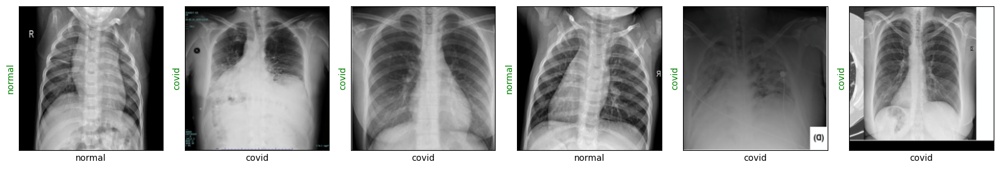

In [17]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

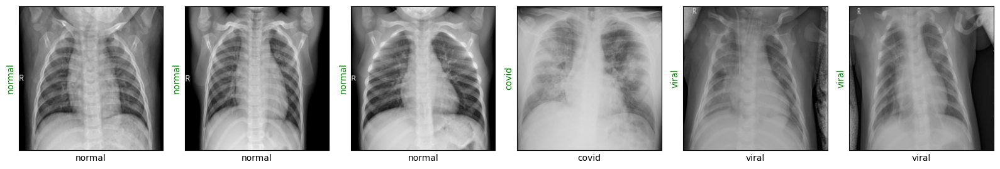

In [18]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

 <h1>5. Creating the Model</h1>

It's time to define our Convolutional Neural Network. You can try a lot of different models that are already built by Pytorch. You can find them in the torchvision.models submodule. You can find more information:

<a>https://pytorch.org/vision/stable/models.html</a>

As you have checked, you have twenty pre-trained models available for you. Why should you use pre-trained models instead of greenfield models? There are a couple of causes that may you make this decission:
* Data availability: training a model is not a piece of cake. In order to sucess, you must have an enough amount of samples. As you've checked out previously, this dataset has no more than 3000 samples.
* Pre-trained models have been tested by the community thousands of times; you can count on their experience to success in your project

Please take a while to look at the next animation of how the convolution process works.

![animation_convolution.gif](images/animation_convolution.gif "segment")

<strong>Exercise 11</strong>: Set up model resnet18 enabling the pretrained mode

In [19]:
### Your code starts here ###



### Your code ends here ###

print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Have you taken a glance at the model architecture? Take your time to do it. The model is not fully applicable to our problem. 
Our model should have three outputs, not 1000 as resnet18 has.

<strong>Exercise 12</strong>: Change the last layer of resnet 18 to have 512 neurons as input and 3 neurons as output

In [20]:
### Your code starts here ###



### Your code ends here ###

Let's test resnet18 with the modification done above to check out if we get the expected output.

In [21]:
x = torch.randn(100, 3, 224, 224)

out = resnet18(x)

print(out.size())

torch.Size([100, 3])


<strong>Exercise 13</strong>: Define the Loss function. Which of all available functions will you use?

In [22]:
### Your code starts here ###



### Your code ends here ###

<strong>Exercise 14</strong>: Define the optimization function you choose for this project. Don't forget to define the learning rate!!

In [23]:
### Your code starts here ###



### Your code ends here ###

Resnet18 is already trained, you can try to predict with it! Let's define a evaluation function and try it.

In [24]:
def show_preds(model):
    model.eval()
    images, labels = next(iter(dl_test))
    outputs  = model(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

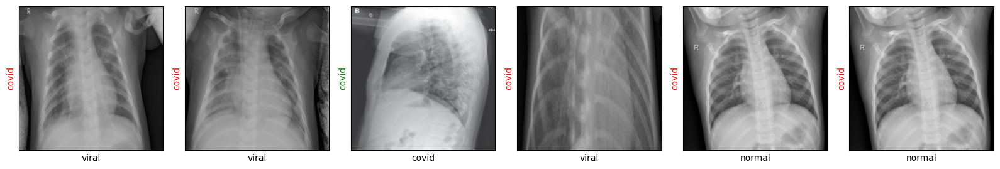

In [25]:
show_preds(resnet18)

# 6. Training the Model

It seems to be a good idea to train Resnet with our X-Ray datasets, so let's define a function that puts all together

<strong>Exercise 15</strong>: Fill up the different proposals you can find in the train function 

In [26]:
def train_eval(epochs,model):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        ### Put Resnet18 in train mode
        ### Your code starts here
        model.train() # set model to training phase
        ### Your code ends here
        
        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            
            ### Use the model to calculate the output (forward pass)
            ### Your code starts here
            
            
            ### Your code ends here
            
            ### Calculate the loss 
            ### Your code starts here
            
            
            ### Your code ends here
            
            ### Run backward function
            ### Your code starts here
            
            
            ### Your code ends here
            
            ### Run the optimization function
            ### Your code starts here
            
            
            ### Your code ends here
            
            train_loss += loss.item()
 
            # We activate the evaluation mode if the model has been trained a multiple number of 20 steps
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                ### Put the model in evaluation mode
                ### Your code starts here
                
                ### Your code ends here
                
                for val_step, (images, labels) in enumerate(dl_test):
                    ### Use the model to calculate the output (forward pass)
                    ### Your code starts here
                    
                    ### Your code ends here
                    
                    ### Calculate the loss 
                    ### Your code starts here
                    
                    ### Your code ends here
                    
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    
                    # Counting the numbers of hits
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                
                # Calculating the number of hits
                accuracy = accuracy/len(test_dataset)
                
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds(model)
                
                # Go back to train mode for next epoch
                model.train()

                if accuracy >= 0.93:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Let's run the training evaluation function

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.1168, Accuracy: 0.3444


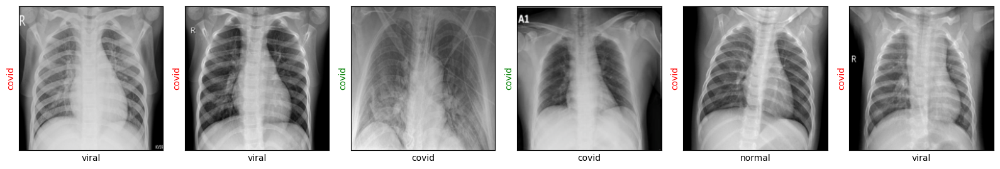

Evaluating at step 20
Validation Loss: 1.2655, Accuracy: 0.3667


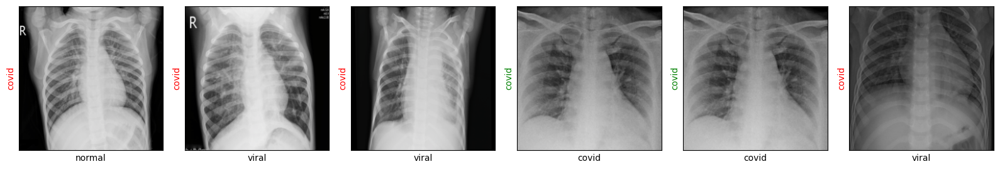

Evaluating at step 40
Validation Loss: 0.9197, Accuracy: 0.6444


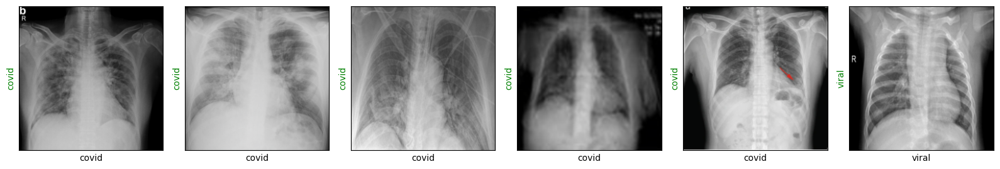

Evaluating at step 60
Validation Loss: 0.6016, Accuracy: 0.8111


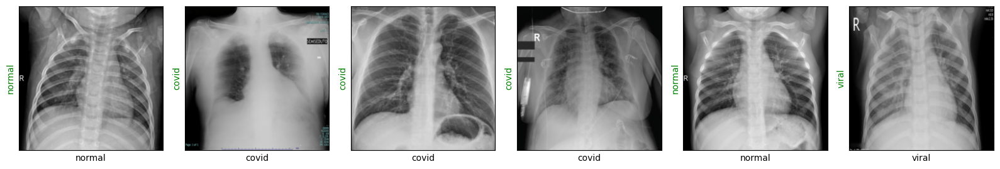

Evaluating at step 80
Validation Loss: 0.6105, Accuracy: 0.7667


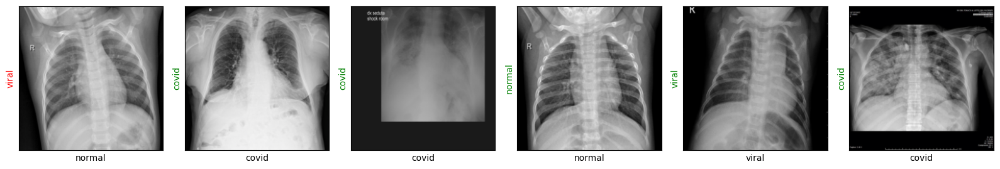

Evaluating at step 100
Validation Loss: 0.3644, Accuracy: 0.9000


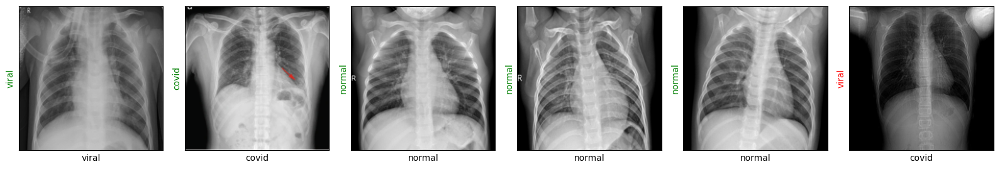

Evaluating at step 120
Validation Loss: 0.4586, Accuracy: 0.8222


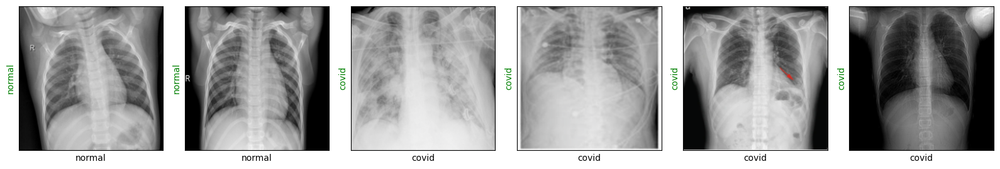

Evaluating at step 140
Validation Loss: 0.3959, Accuracy: 0.8778


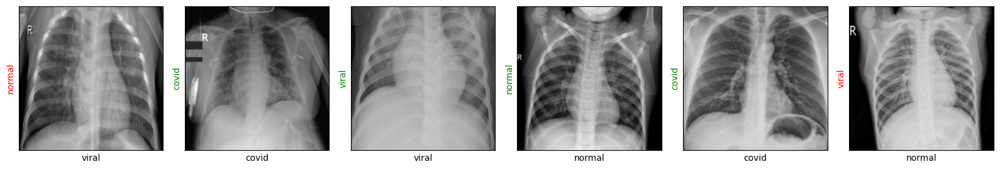

Evaluating at step 160
Validation Loss: 0.4145, Accuracy: 0.8556


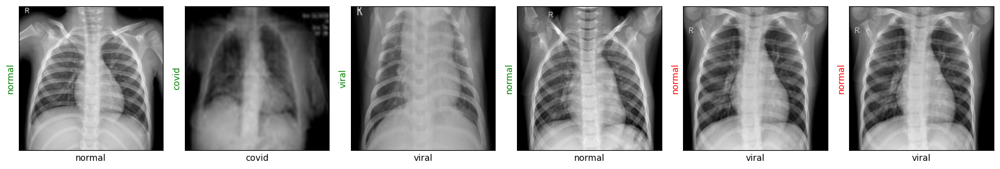

Evaluating at step 180
Validation Loss: 0.4417, Accuracy: 0.8556


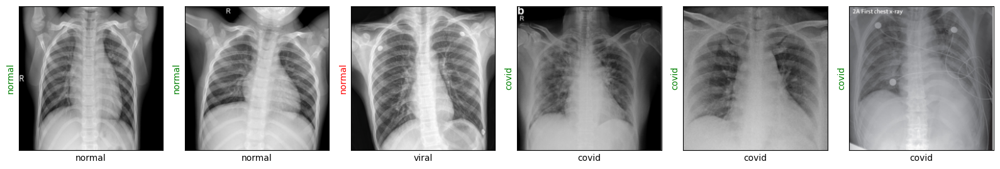

Evaluating at step 200
Validation Loss: 0.2954, Accuracy: 0.8889


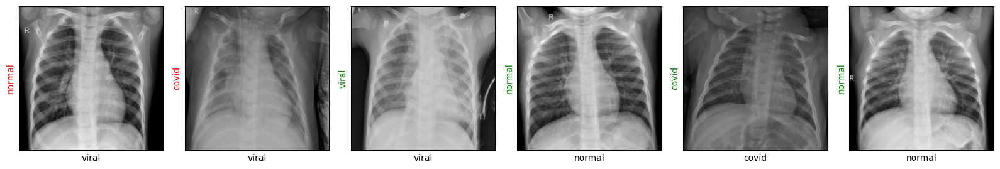

Evaluating at step 220
Validation Loss: 0.4190, Accuracy: 0.8556


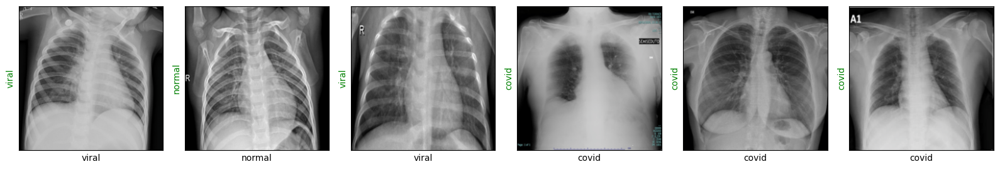

Evaluating at step 240
Validation Loss: 0.2668, Accuracy: 0.8889


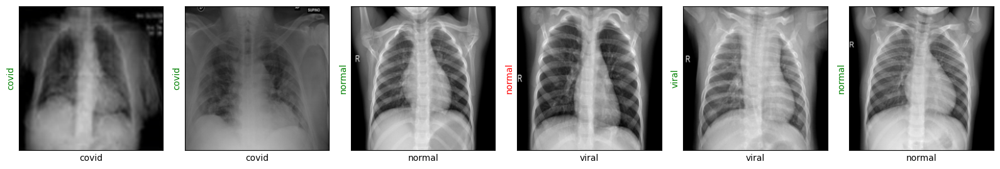

Evaluating at step 260
Validation Loss: 0.2804, Accuracy: 0.9000


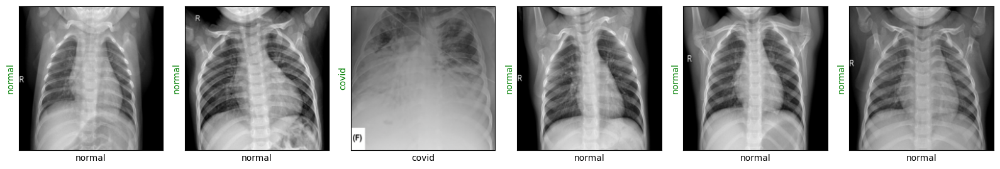

Evaluating at step 280
Validation Loss: 0.3436, Accuracy: 0.8556


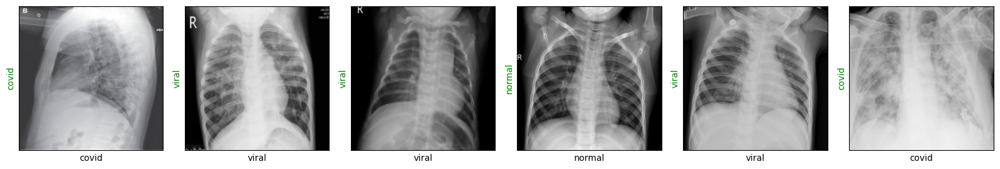

Evaluating at step 300
Validation Loss: 0.3223, Accuracy: 0.9333


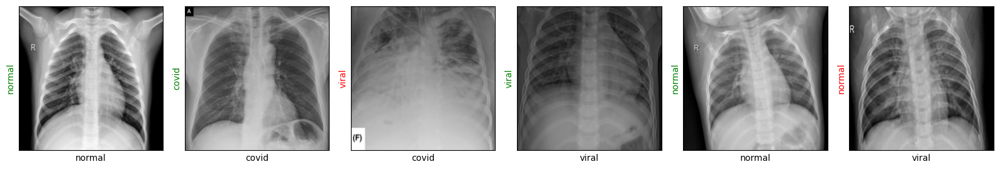

Performance condition satisfied, stopping..
CPU times: total: 17min 49s
Wall time: 5min 53s


In [27]:
%%time

train_eval(epochs=1,model=resnet18)

# 7. Model Performance



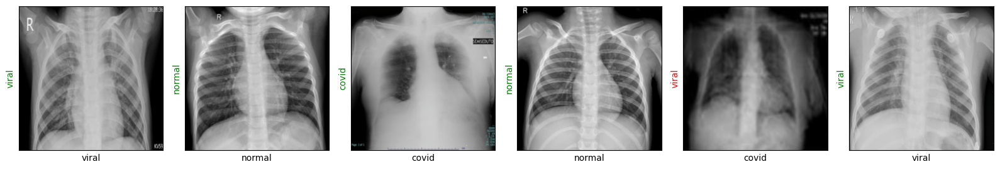

In [28]:
show_preds(resnet18)

<h1> 8. Try your own Convolutional Neural Network

Resnet is a widely tested Convolutional Neural Network. Maybe you want to open the blackbox and change any gear, or add a couple of them. Now it's time to build your own CNN and play with its components.


As we've already mentioned, it's a good practice to draw a sketch of the arquitecture you want to build. We will use the architecture coded below to dive into a Convolutional architecture

In [32]:
class PersonalizedConvNet(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = torch.nn.Conv2d(3, 64, kernel_size=2, stride=2, padding=1)
        self.act1  = torch.nn.ReLU()
        self.pool1 = torch.nn.MaxPool2d(kernel_size=2)
        self.conv2 = torch.nn.Conv2d(64, 128, kernel_size=(2, 2), stride=(1, 1), padding=1)
        self.act2  = torch.nn.ReLU()
        self.pool2 = torch.nn.MaxPool2d(2)
        self.fc1   = torch.nn.Linear(128 * 28 * 28, 512)
        self.act3  = torch.nn.ReLU()
        self.fc2   = torch.nn.Linear(512 ,3)
        
        
    def forward(self,input):
        out = self.pool1(self.act1(self.conv1(input)))
        out = self.pool2(self.act2(self.conv2(out)))
        out = torch.reshape(out,(-1,(128 * 28 * 28)))
        out = self.act3(self.fc1(out))
        out = self.fc2(out)
        
        return out

In [33]:
my_convnet = PersonalizedConvNet()

<strong>Exercise 16</strong>: Recall the size of the picture that represents an X-ray

In [35]:
### Your code starts here



### Your code ends here

print("The size of the X-ray pictures is {0:s}".format(str(picture_size)))

The size of the X-ray pictures is torch.Size([3, 224, 224])


<h2> Convolutional Layer</h2>
The first line codes a convolutional layer with a 3-channel input (RGB image), 64 filters (because of a 64-channel output), a filter/kernel size of 2x2, with a filter step size (stride) of 2 in both dimensions, and 1 padding pixel on each side of the input.

After the convolution, you will get a new matrix with the size given by the following formula, with:

    Matrix (n,n) = (224,224)

    Kernel (f,f) = (2,2)

    Padding p = 1

    Stride s = 2

$output\:size = (\frac{n[0]+2·p-(f[0]-1)-1}{s}+1, \frac{n[1]+2·p-(f[1]-1)-1}{s}+1) = (113, 113)$

<strong>Exercise 17</strong>: Create a model that contains only the first layer, plug in a matrix with the same size as X-ray and check if the ouput size matches the output you've calculated with the given formula

In [36]:
### Your code starts here ###


### Your code ends here ###

print("The size of the output of my testing model is {0:s}".format(str(test_out.size())))

The size of the output of my testing model is torch.Size([1, 64, 113, 113])


Ok now you have figured out how a Convolution operation works, and what matrix size you get as an output. Let's check out how the MaxPool Layer works. 

<h2> MaxPool Layer </h2>

Maxpool layer is a special case of the convolutional layer. In more technical terms, the maxpool layer works by partitioning the input volume into a set of non-overlapping rectangular sub-regions, called pooling regions. For each pooling region, the maxpool layer outputs the maximum value of the activations within that region, while discarding the other values. 

Maybe with the picture shown below, you will get it quicker.

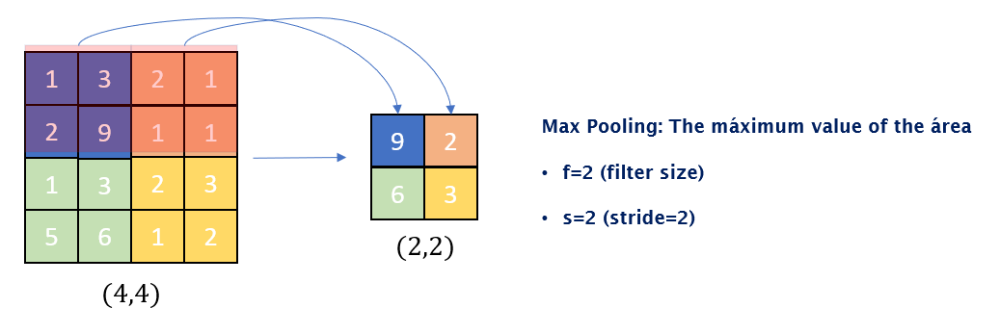

At last, Maxpool is a particular case where there is no overlapping among the successive convolution operations. 

It's time to adapt your testing class in order to check out the matrix size of the output

<strong>Exercise 18</strong>: Adapt your testing model adding the Maxpool layer. Plug in a matrix with the same size as X-ray and check out if the ouput size matches the output you've calculated with the given formula

In [37]:
### Your code starts here ###



### Your code ends here ###

print("The size of the output of my testing model is {0:s}".format(str(test_out.size())))

The size of the output of my testing model is torch.Size([1, 64, 56, 56])


Applying a convolution with kernel_size=(2,2) and stride=(2,2) is the same operation as a MaxPool2D with kernel_size=(2,2) in the context of down-sampling the input features.

You can now draw a sketch of the Convolutional Network we've brought to the table. It's worth saying that part of the architecture is a classical Neural Network with just one hidden layer.

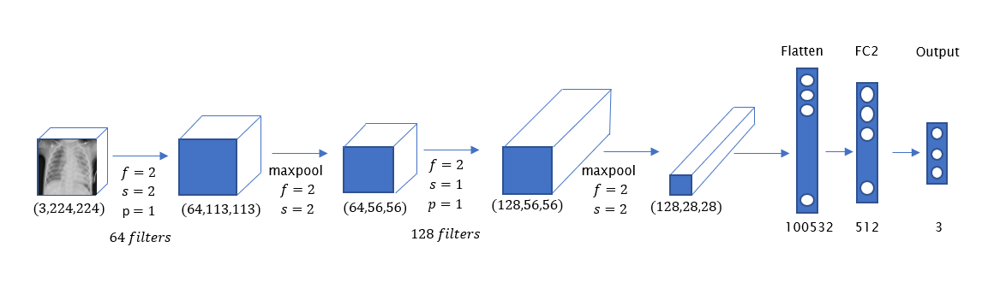

<strong>Exercise 19</strong>: Apply the training/evaluation function to this new model and compare its perfomance to the one obtained with Resnet18

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.1144, Accuracy: 0.2444


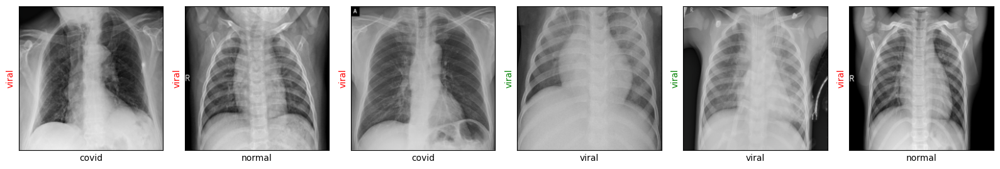

Evaluating at step 20
Validation Loss: 1.2059, Accuracy: 0.2556


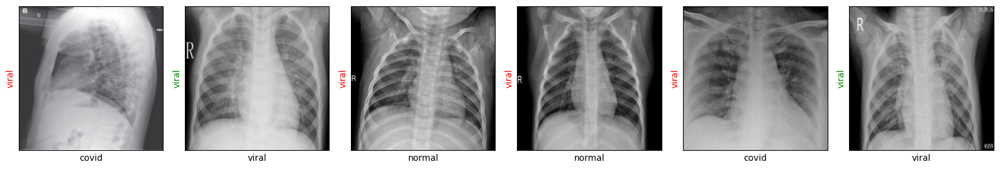

Evaluating at step 40
Validation Loss: 1.1878, Accuracy: 0.3556


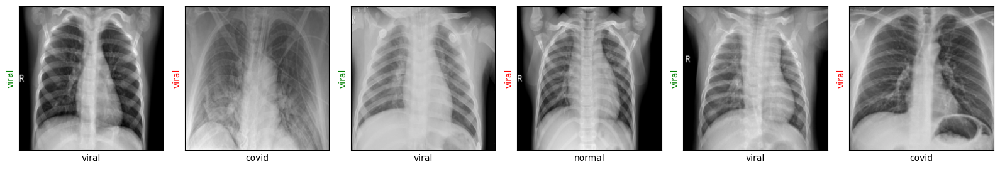

Evaluating at step 60
Validation Loss: 1.1986, Accuracy: 0.2889


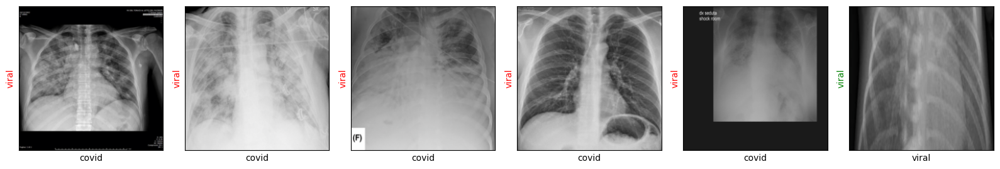

Evaluating at step 80
Validation Loss: 1.1925, Accuracy: 0.3667


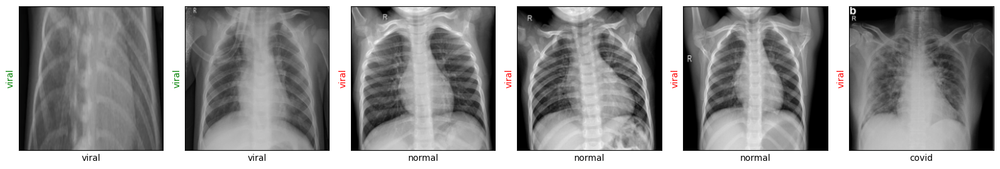

Evaluating at step 100
Validation Loss: 1.1901, Accuracy: 0.3556


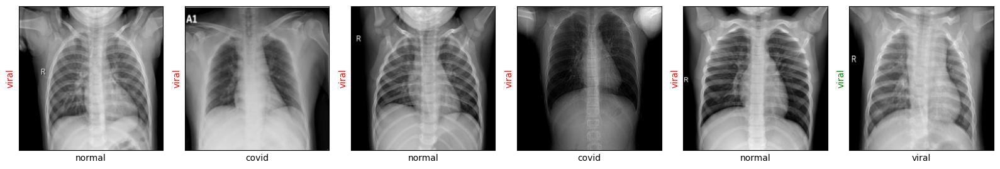

Evaluating at step 120
Validation Loss: 1.1841, Accuracy: 0.3889


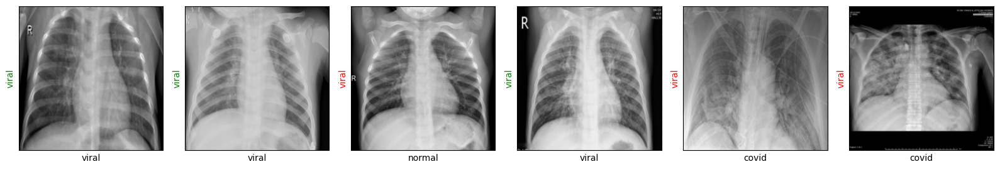

Evaluating at step 140
Validation Loss: 1.1940, Accuracy: 0.3111


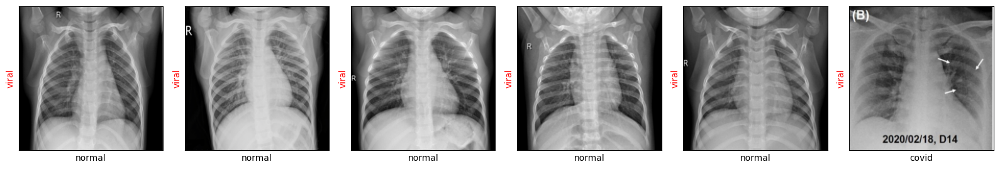

Evaluating at step 160
Validation Loss: 1.1849, Accuracy: 0.4111


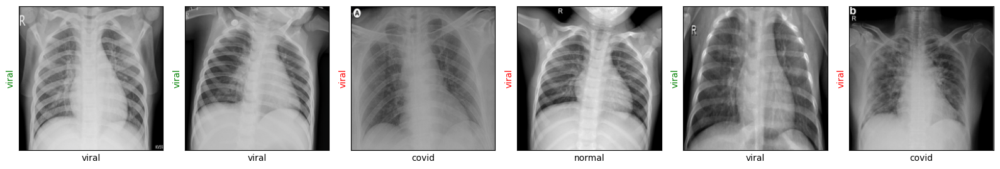

Evaluating at step 180
Validation Loss: 1.1858, Accuracy: 0.3667


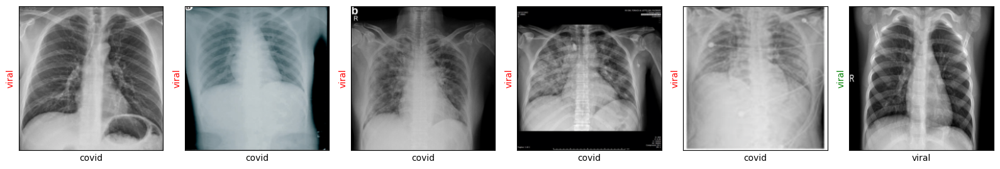

Evaluating at step 200
Validation Loss: 1.1936, Accuracy: 0.3778


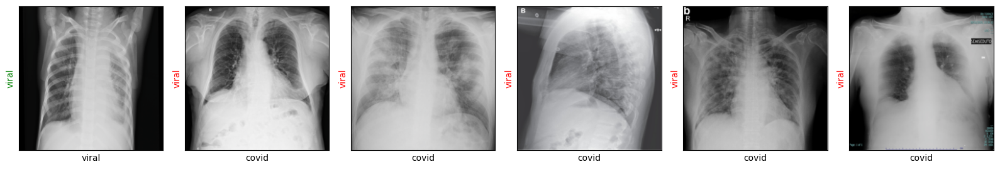

Evaluating at step 220
Validation Loss: 1.1909, Accuracy: 0.3889


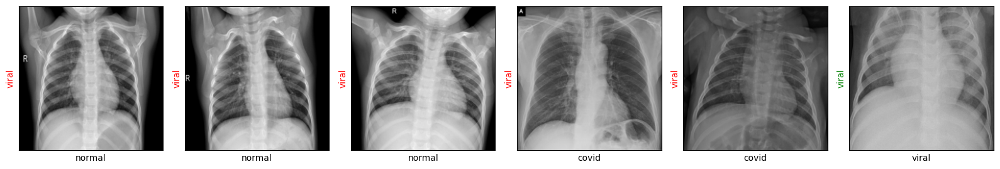

Evaluating at step 240
Validation Loss: 1.2146, Accuracy: 0.2889


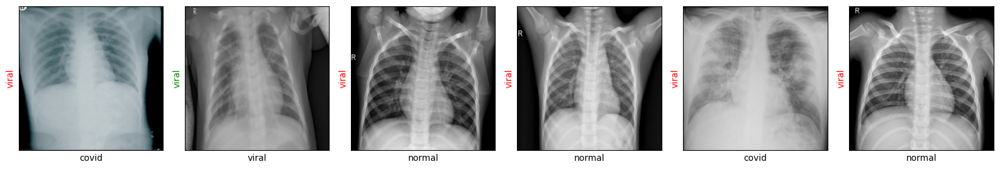

Evaluating at step 260
Validation Loss: 1.1983, Accuracy: 0.3333


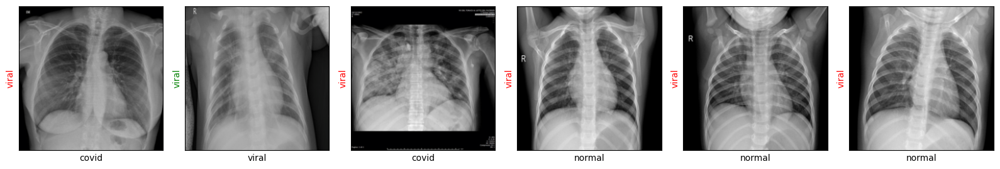

Evaluating at step 280
Validation Loss: 1.2083, Accuracy: 0.3111


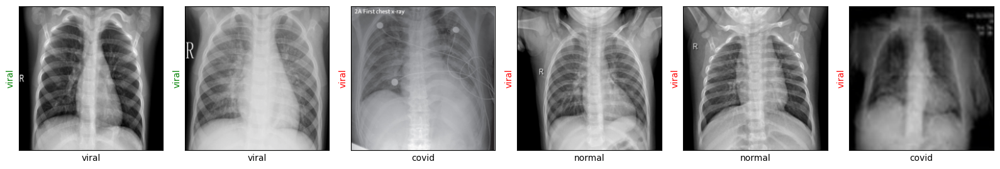

Evaluating at step 300
Validation Loss: 1.2038, Accuracy: 0.3444


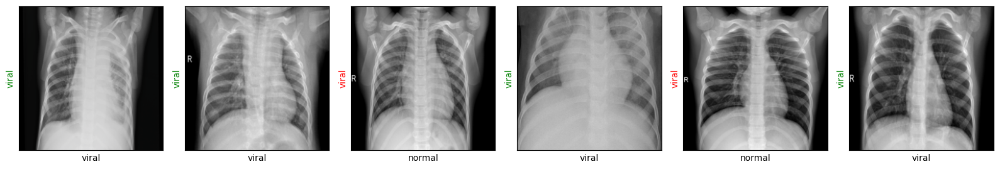

Evaluating at step 320
Validation Loss: 1.1827, Accuracy: 0.3889


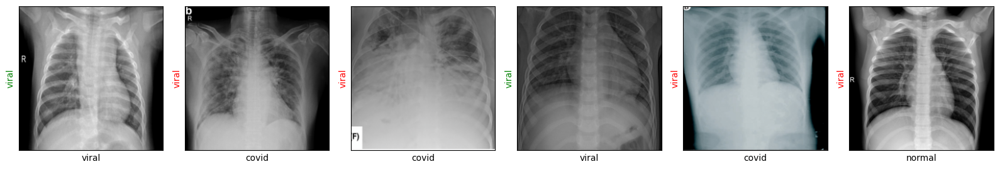

Evaluating at step 340
Validation Loss: 1.2021, Accuracy: 0.3222


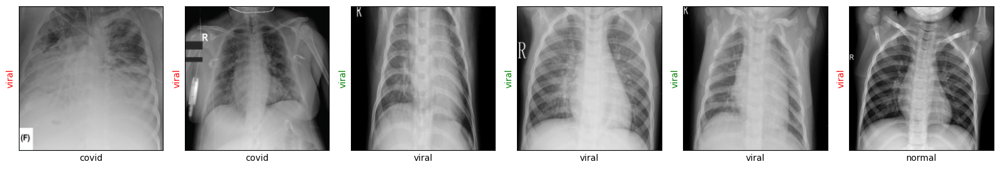

Evaluating at step 360
Validation Loss: 1.1821, Accuracy: 0.3778


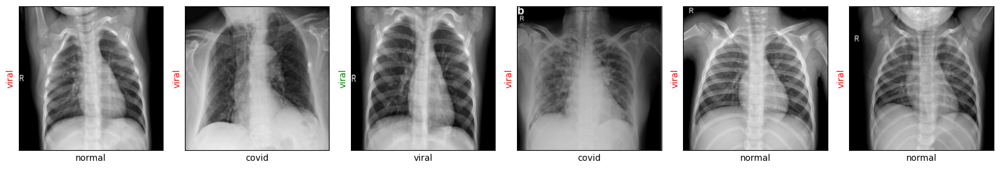

Evaluating at step 380
Validation Loss: 1.1888, Accuracy: 0.3333


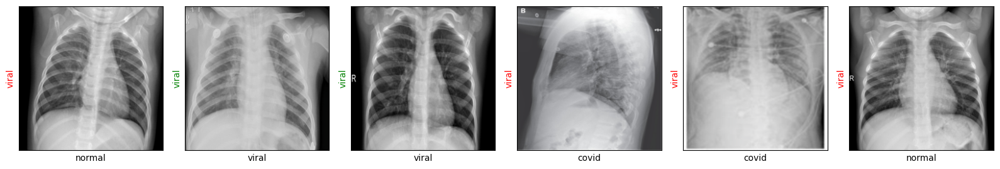

Evaluating at step 400
Validation Loss: 1.1855, Accuracy: 0.3889


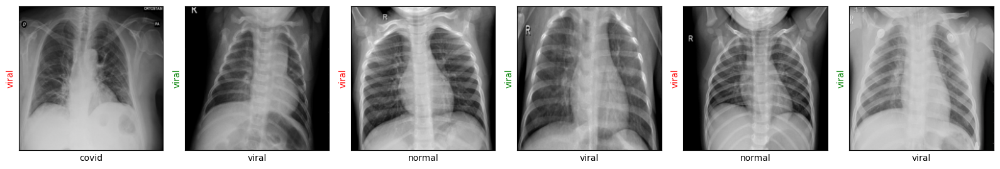

Evaluating at step 420
Validation Loss: 1.1879, Accuracy: 0.3667


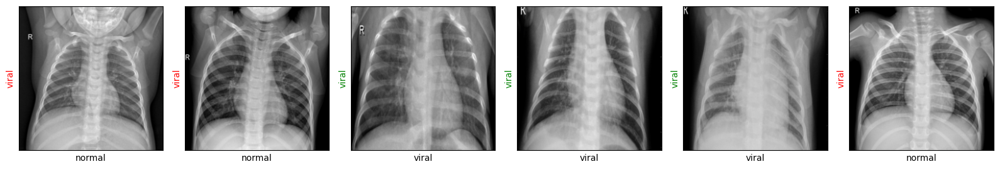

Evaluating at step 440
Validation Loss: 1.1691, Accuracy: 0.4444


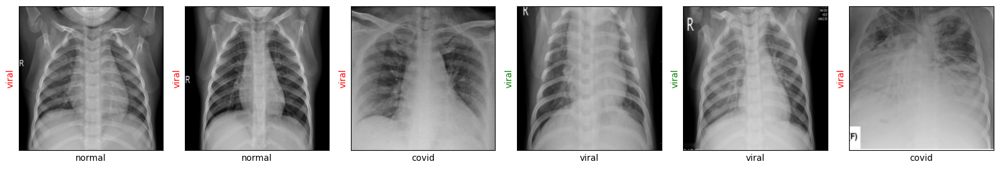

Evaluating at step 460
Validation Loss: 1.1918, Accuracy: 0.3000


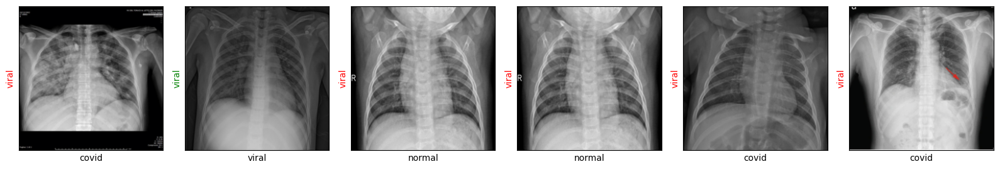

Training Loss: 1.1125
Training complete..


In [38]:
### Your code starts here ###


### Your code ends ###

It's seems that Resnet18 works better than our model. But now you know how to implement your own Convolutional Neural Network from scratch!

Who dares beating Resnet18?.... Can you reach the accuracy of Resnet18 with your own model? It's your turn...